In [2]:
#import libraries
import matplotlib.pyplot as plt
%matplotlib inline
import math
import numpy as np
import scipy.optimize as opt
import pandas as pd
from mpl_toolkits.mplot3d import axes3d

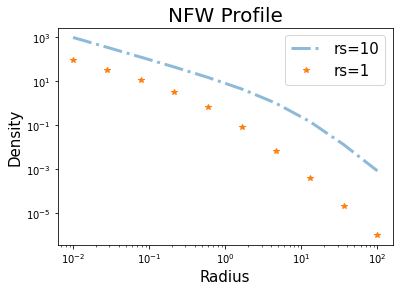

In [3]:
#NFW Density Profile
def NFW(r,ro0, rs):
    return(ro0/((r/rs)*(1+(r/rs))**2))


# p=np.linspace(0.01,100, 1000)
p=np.logspace(-2,2, 10, base=10)

nfw_values=NFW(p,1.0,10.)
nfw_values2=NFW(p, 1., 1.)

# plt.plot(np.log10(p), np.log10(nfw_values)) 
plt.xlabel('Radius', fontsize=15)
plt.ylabel('Density', fontsize=15)
plt.plot(p, nfw_values, '-.', linewidth=3, alpha=0.5, label="rs=10")
plt.plot(p, nfw_values2, '*', label="rs=1")
plt.xscale('log')
plt.yscale('log')
plt.legend(loc=0, fontsize=15)
plt.title("NFW Profile", fontsize=20)
plt.savefig("NFWProfile.png")

In [4]:
def density(rs, M, r):
    return M / (((4 * np.pi) * rs**3) * ((np.log(1 + (r/rs)) - ((r/rs)/(1+(r/rs))))))

Text(0.5, 1.0, 'NFW Profile')

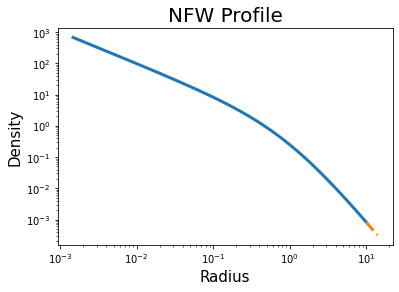

In [5]:
#grabbing particles untuncrated file
NFW_Profile_untuncrated = np.loadtxt("10e5noT.txt",skiprows=2)

# total particles times the mass of each particle
massTotal = NFW_Profile_untuncrated.shape[0] * 1e-5

# Grabbing x,y,z
X = NFW_Profile_untuncrated[:,1]
Y = NFW_Profile_untuncrated[:,2]
Z = NFW_Profile_untuncrated[:,3]

#getting radius for each particle
radius = np.sqrt(X**2 + Y**2 + Z**2)

#sorting the radius
radius.sort()

#getting d0
d0 = density(10, 1, 100)

#NFW values
nfw = NFW(radius, d0, 10)

#grabbing particles tuncrated files
NFW_Profile_tuncrated = np.loadtxt("10e5T.txt",skiprows=1)

# total particles times the mass of each particle
massTotalT = NFW_Profile_tuncrated.shape[0] * 1e-5

# Grabbing x,y,z
Xt = NFW_Profile_tuncrated[:,1]
Yt = NFW_Profile_tuncrated[:,2]
Zt = NFW_Profile_tuncrated[:,3]

#getting radius for each particle
radiust = np.sqrt(Xt**2 + Yt**2 + Zt**2)

#sorting the radius
radiust.sort()

#getting d0
d0t = density(10, 1, 100)

#NFW values
nfwt = NFW(radiust, d0t, 10)


# Plotting
plt.xlabel('Radius', fontsize=15)
plt.ylabel('Density', fontsize=15)
plt.xscale('log')
plt.yscale('log')
plt.plot(radius/10, nfw/d0 , linestyle = '-', linewidth = 3, alpha=1, label="rs=10")
plt.plot(radiust/10, nfwt/d0t, linestyle='--', linewidth = 3, alpha=1, label="rs=10")
plt.title("NFW Profile", fontsize=20)


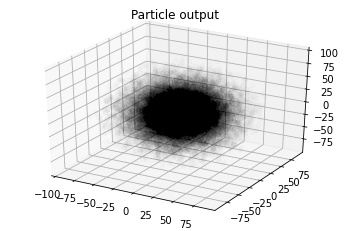

In [6]:
#Plotting the points
ICLnfw = np.loadtxt("snapshot10e5t.txt")
particleNumber = ICLnfw[:,0]
X = ICLnfw[:,1]
Y = ICLnfw[:,2]
Z = ICLnfw[:,3]
# plt.plot_trisurf(x,y,z)
# plt.scatter(x,y, z, c='red')
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
# ax.plot_trisurf(X, Y, Z, color='white', alpha=0.5)
ax.scatter(X, Y, Z, c='Black', alpha=0.01)
plt.title("Particle output")
plt.show()
fig.savefig("3D")

In [8]:
def softening_length(rh, N):
    return 0.5 * rh * (N ** -(1/3))
#soft length ɛ = rs*0.01


10*0.01    

0.1

In [9]:
def relaxation_time(N, R, M):
    return ((0.1*N)/(np.log(N))) * np.sqrt((R**3)/(6.67408e-11 * M))

In [10]:
ic10e5t = np.loadtxt("snapshot10e5t.txt")
particleNumber = ic10e5t[:,0]
x = ic10e5t[:,1]
y = ic10e5t[:,2]
z = ic10e5t[:,3]

ic10e5t1 = np.loadtxt("snapshot10e5t1.txt")
particleNumber1 = ic10e5t1[:,0]
x1 = ic10e5t1[:,1]
y1 = ic10e5t1[:,2]
z1 = ic10e5t1[:,3]

ic10e5t2 = np.loadtxt("snapshot10e5t2.txt")
particleNumber2 = ic10e5t2[:,0]
x2 = ic10e5t2[:,1]
y2 = ic10e5t2[:,2]
z2 = ic10e5t2[:,3]

ic10e5t3 = np.loadtxt("snapshot10e5t3.txt")
particleNumber3 = ic10e5t3[:,0]
x3 = ic10e5t3[:,1]
y3 = ic10e5t3[:,2]
z3 = ic10e5t3[:,3]

ic10e5t4 = np.loadtxt("snapshot10e5t4.txt")
particleNumber4 = ic10e5t4[:,0]
x4 = ic10e5t4[:,1]
y4 = ic10e5t4[:,2]
z4 = ic10e5t4[:,3]

ic10e5t5 = np.loadtxt("snapshot10e5t5.txt")
particleNumber5 = ic10e5t5[:,0]
x5 = ic10e5t5[:,1]
y5 = ic10e5t5[:,2]
z5 = ic10e5t5[:,3]


rad = np.sqrt(x**2 + y**2 + z**2)
rad1 = np.sqrt(x1**2 + y1**2 + z1**2)
rad2 = np.sqrt(x2**2 + y2**2 + z2**2)
rad3 = np.sqrt(x3**2 + y3**2 + z3**2)
rad4 = np.sqrt(x4**2 + y4**2 + z4**2)
rad5 = np.sqrt(x5**2 + y5**2 + z5**2)

In [11]:
number_particles1 = np.histogram(rad, bins=np.logspace(-1,2,50))
number_particles2 = np.histogram(rad1, bins=np.logspace(-1,2,50))
number_particles3 = np.histogram(rad2, bins=np.logspace(-1,2,50))
number_particles4 = np.histogram(rad3, bins=np.logspace(-1,2,50))
number_particles5 = np.histogram(rad4, bins=np.logspace(-1,2,50))

In [12]:
mass1 = np.array(number_particles1[0]) * 1e-5
    
mass2 = np.array(number_particles2[0]) * 1e-5
    
mass3 = np.array(number_particles3[0]) * 1e-5
    
mass4 = np.array(number_particles4[0]) * 1e-5
    
mass5 = np.array(number_particles5[0]) * 1e-5


In [13]:
volume1 = []

for i in range(len(mass1)):
    volume1.append((4/3) * np.pi * ((number_particles1[1][i+1]**3)-(number_particles1[1][i]**3)))
volume1 = np.array(volume1)

volume2 = []

for i in range(len(mass2)):
    volume2.append((4/3) * np.pi * ((number_particles2[1][i+1]**3)-(number_particles2[1][i]**3)))
volume2 = np.array(volume2)
    
volume3 = []

for i in range(len(mass3)):
    volume3.append((4/3) * np.pi * ((number_particles3[1][i+1]**3)-(number_particles3[1][i]**3)))
volume3 = np.array(volume3)   

volume4 = []

for i in range(len(mass4)):
    volume4.append((4/3) * np.pi * ((number_particles4[1][i+1]**3)-(number_particles4[1][i]**3)))
volume4 = np.array(volume4)

volume5 = []

for i in range(len(mass5)):
    volume5.append((4/3) * np.pi * ((number_particles5[1][i+1]**3)-(number_particles5[1][i]**3)))
    
volume5 = np.array(volume5)

In [14]:
density1= mass1/volume1
    
density2 = mass2/volume2
    
density3 = mass3/volume3
    
density4 = mass4/volume4

density5 = mass5/volume5

In [15]:
density1 = np.append(density1, 0)
density2 = np.append(density2, 0)
density3 = np.append(density3, 0)
density4 = np.append(density4, 0)

# NFW profile vs Density profiles for each of the Snapshots

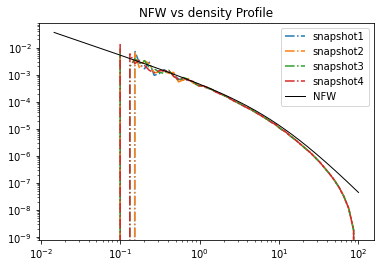

In [16]:
plt.plot(number_particles1[1], density1, "-.",label="snapshot1")
plt.plot(number_particles2[1], density2, "-.",label="snapshot2")
plt.plot(number_particles3[1], density3, "-.",label="snapshot3")
plt.plot(number_particles4[1], density4, "-.",label="snapshot4")
plt.plot(radius, nfw, linestyle = '-', linewidth = 1, alpha=1,color = "black", label="NFW")
plt.title("NFW vs density Profile")
plt.xscale("log")
plt.yscale("log")
plt.legend()
plt.savefig("ICNFWvsDensityProfile.png")

In [17]:
ICV = np.loadtxt("10e5.txt",skiprows=1)
G = np.sqrt((300+ (ICV.shape[0] * 1e-5))/500)

ICV[:,1] = ICV[:,1] + 500
ICV[:,5] = ICV[:,5] + G


np.savetxt("10e5.txt",ICV,fmt='%i %f %f %f %f %f %f')






In [18]:
ICV = np.loadtxt("10e5T.txt",skiprows=1)


In [19]:
x = []
y = []
for i in range(51):
    if i <10:
        idk = np.loadtxt("00"+str(i)+".txt",skiprows=7)
        x.append(idk[:,1])
        y.append(idk[:,2])
    else:
        idk = np.loadtxt("0"+str(i)+".txt",skiprows=7)
        x.append(idk[:,1])
        y.append(idk[:,2])

AttributeError: 'AxesSubplot' object has no attribute 'plot_trisurf'

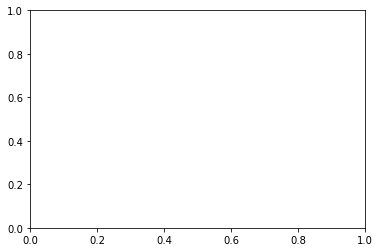

In [20]:
#Plotting the points
ICLnfw = np.loadtxt("000.txt", skiprows=7)
ICLnfw2 = np.loadtxt("015.txt", skiprows=7)
ICLnfw3 = np.loadtxt("030.txt", skiprows=7)
ICLnfw4 = np.loadtxt("045.txt", skiprows=7)
ICLnfw5 = np.loadtxt("050.txt", skiprows=7)
ICLnfw6 = np.loadtxt("015second.txt", skiprows=7)
ICLnfw7 = np.loadtxt("030second.txt", skiprows=7)
ICLnfw8 = np.loadtxt("045second.txt", skiprows=7)

particleNumber = ICLnfw[:,0]
X = ICLnfw[:,1]
Y = ICLnfw[:,2]
Z = ICLnfw[:,3]

X2 = ICLnfw2[:,1]
Y2 = ICLnfw2[:,2]
Z2 = ICLnfw2[:,3]

X3 = ICLnfw3[:,1]
Y3 = ICLnfw3[:,2]

X4 = ICLnfw4[:,1]
Y4 = ICLnfw4[:,2]

X5 = ICLnfw5[:,1]
Y5 = ICLnfw5[:,2]

X6 = ICLnfw6[:,1]
Y6 = ICLnfw6[:,2]

X7 = ICLnfw7[:,1]
Y7 = ICLnfw7[:,2]

X8 = ICLnfw8[:,1]
Y8 = ICLnfw8[:,2]


# plt.plot_trisurf(x,y,z)
# plt.scatter(x,y, z, c='red')
fig = plt.figure()
ax = fig.add_subplot(111)
ax.plot_trisurf(X, Y, Z, color='white', alpha=0.5)
ax.scatter(X, Y, c='Black', alpha=0.01)
plt.show()

In [ ]:
fig, axs = plt.subplots(2,4)
snap0 = np.histogram2d(X,Y,bins=100)
snap015 = np.histogram2d(X2,Y2,bins=100)
snap030 = np.histogram2d(X3,Y3,bins=100)
snap045 = np.histogram2d(X4,Y4,bins=100)
snap050 = np.histogram2d(X5,Y5,bins=100)
snap065 = np.histogram2d(X6,Y6,bins=100)
snap080 = np.histogram2d(X7,Y7,bins=100)
snap095 = np.histogram2d(X8,Y8,bins=100)
axs[0,0].imshow(snap0[0])
axs[0,0].set_title("Snapshot 0")
axs[0,1].imshow(snap015[0])
axs[0,1].set_title("Snapshot 15")
axs[0,2].imshow(snap030[0])
axs[0,2].set_title("Snapshot 30")
axs[0,3].imshow(snap045[0])
axs[0,3].set_title("Snapshot 45")
axs[1,0].imshow(snap050[0])
axs[1,0].set_title("Snapshot 50")
axs[1,1].imshow(snap065[0])
axs[1,1].set_title("Snapshot 65")
axs[1,2].imshow(snap080[0])
axs[1,2].set_title("Snapshot 80")
axs[1,3].imshow(snap095[0])
axs[1,3].set_title("Snapshot 95")
plt.savefig("Histogram.png")

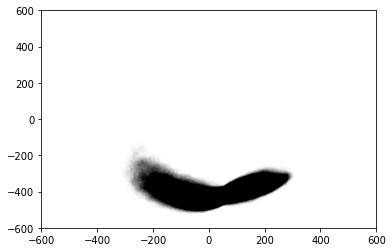

In [10]:
#Plotting the points
ICLnfw = np.loadtxt("testtft.txt",skiprows=7)
particleNumber = ICLnfw[:,0]
X = ICLnfw[:,1]
Y = ICLnfw[:,2]
Z = ICLnfw[:,3]
# plt.plot_trisurf(x,y,z)
# plt.scatter(x,y, z, c='red')
fig = plt.figure()
ax = fig.add_subplot(111)
# ax.plot_trisurf(X, Y, Z, color='white', edgecolors='grey', alpha=0.5)
ax.scatter(X, Y, c='Black', alpha=0.01)
ax.set_ylim(-600,600)
ax.set_xlim(-600,600)
plt.show()

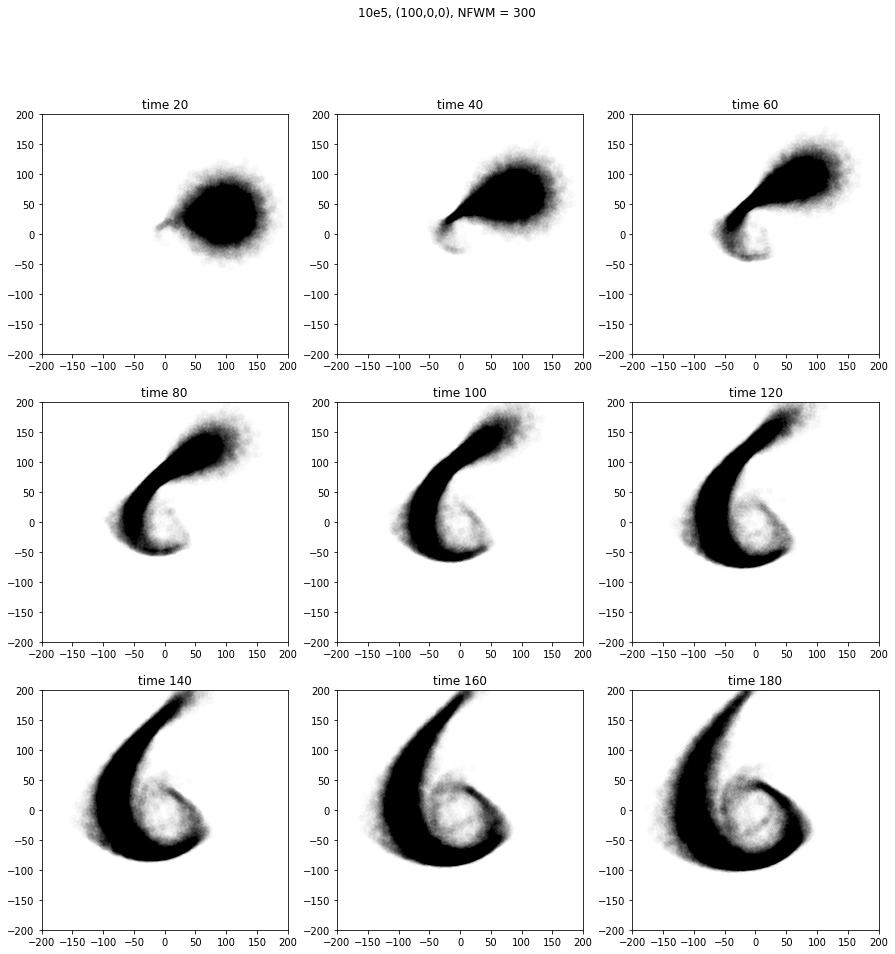

In [7]:
#Plotting the points
ICLnfw = np.loadtxt("testcirc2.txt",skiprows=7)
particleNumber = ICLnfw[:,0]
X = ICLnfw[:,1]
Y = ICLnfw[:,2]
Z = ICLnfw[:,3]

ICLnfw2 = np.loadtxt("testcirc4.txt",skiprows=7)
particleNumber2 = ICLnfw2[:,0]
X2 = ICLnfw2[:,1]
Y2 = ICLnfw2[:,2]
Z2 = ICLnfw2[:,3]


ICLnfw3 = np.loadtxt("testcirc6.txt",skiprows=7)
particleNumber3 = ICLnfw3[:,0]
X3 = ICLnfw3[:,1]
Y3 = ICLnfw3[:,2]
Z3 = ICLnfw3[:,3]

ICLnfw4 = np.loadtxt("testcirc8.txt",skiprows=7)
particleNumber4 = ICLnfw4[:,0]
X4 = ICLnfw4[:,1]
Y4 = ICLnfw4[:,2]
Z4 = ICLnfw4[:,3]

ICLnfw5 = np.loadtxt("testcirc10.txt",skiprows=7)
particleNumber5 = ICLnfw5[:,0]
X5 = ICLnfw5[:,1]
Y5 = ICLnfw5[:,2]
Z5 = ICLnfw5[:,3]

ICLnfw6 = np.loadtxt("testcirc12.txt",skiprows=7)
particleNumber6 = ICLnfw6[:,0]
X6 = ICLnfw6[:,1]
Y6 = ICLnfw6[:,2]
Z6 = ICLnfw6[:,3]

ICLnfw7 = np.loadtxt("testcirc14.txt",skiprows=7)
particleNumber7 = ICLnfw7[:,0]
X7 = ICLnfw7[:,1]
Y7 = ICLnfw7[:,2]
Z7 = ICLnfw7[:,3]

ICLnfw8 = np.loadtxt("testcirc16.txt",skiprows=7)
X8 = ICLnfw8[:,1]
Y8 = ICLnfw8[:,2]
Z8 = ICLnfw8[:,3]

ICLnfw9 = np.loadtxt("testcirc18.txt",skiprows=7)
X9 = ICLnfw9[:,1]
Y9 = ICLnfw9[:,2]
Z9 = ICLnfw9[:,3]

fig, axs = plt.subplots(3,3,figsize=(15,15))
axs[0,0].scatter(X, Y, c='Black', alpha=0.01)
axs[0,0].set_title("time 20")
axs[0,0].set_xlim(-200,200)
axs[0,0].set_ylim(-200,200)


axs[0,1].scatter(X2, Y2, c='Black', alpha=0.01)
axs[0,1].set_title("time 40")
axs[0,1].set_xlim(-200,200)
axs[0,1].set_ylim(-200,200)


axs[0,2].scatter(X3, Y3, c='Black', alpha=0.01)
axs[0,2].set_title("time 60")
axs[0,2].set_xlim(-200,200)
axs[0,2].set_ylim(-200,200)


axs[1,0].scatter(X4, Y4, c='Black', alpha=0.01)
axs[1,0].set_title("time 80")
axs[1,0].set_xlim(-200,200)
axs[1,0].set_ylim(-200,200)


axs[1,1].scatter(X5, Y5, c='Black', alpha=0.01)
axs[1,1].set_title("time 100")
axs[1,1].set_xlim(-200,200)
axs[1,1].set_ylim(-200,200)


axs[1,2].scatter(X6, Y6, c='Black', alpha=0.01)
axs[1,2].set_title("time 120")
axs[1,2].set_xlim(-200,200)
axs[1,2].set_ylim(-200,200)



axs[2,0].scatter(X7, Y7, c='Black', alpha=0.01)
axs[2,0].set_title("time 140")
axs[2,0].set_xlim(-200,200)
axs[2,0].set_ylim(-200,200)



axs[2,1].scatter(X8, Y8, c='Black', alpha=0.01)
axs[2,1].set_title("time 160")
axs[2,1].set_xlim(-200,200)
axs[2,1].set_ylim(-200,200)


axs[2,2].scatter(X9, Y9, c='Black', alpha=0.01)
axs[2,2].set_title("time 180")
axs[2,2].set_xlim(-200,200)
axs[2,2].set_ylim(-200,200)


fig.suptitle('10e5, (100,0,0), NFWM = 300')
plt.show()
fig.savefig("10e5,(100,0,0).png")

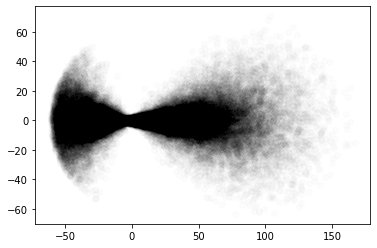

In [19]:
#Plotting the points
ICLnfw = np.loadtxt("031.txt",skiprows=7)
particleNumber = ICLnfw[:,0]
X = ICLnfw[:,1]
Y = ICLnfw[:,2]
Z = ICLnfw[:,3]
# plt.plot_trisurf(x,y,z)
# plt.scatter(x,y, z, c='red')
fig = plt.figure()
ax = fig.add_subplot(111)
# ax.plot_trisurf(X, Y, Z, color='white', edgecolors='grey', alpha=0.5)
ax.scatter(X, Y, c='Black', alpha=0.01)

plt.show()

In [53]:
snap0[1]

array([  5.989153 ,  24.7933398,  43.5975266,  62.4017134,  81.2059002,
       100.010087 , 118.8142738, 137.6184606, 156.4226474, 175.2268342,
       194.031021 ])

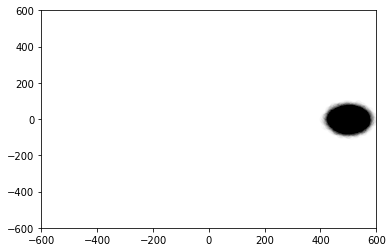

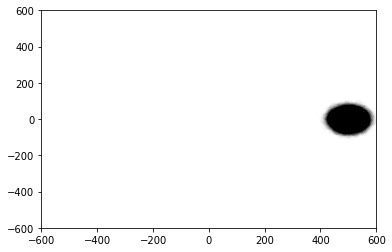

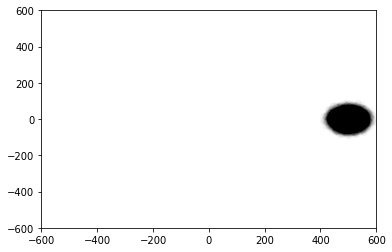

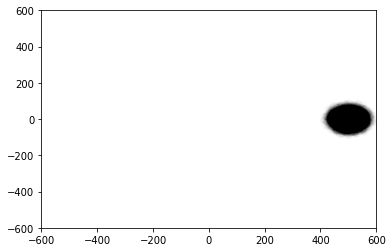

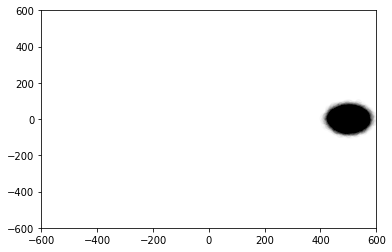

...

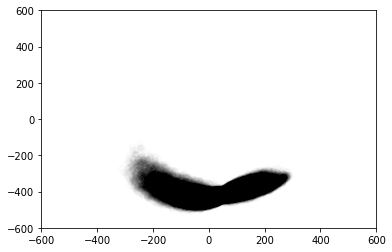

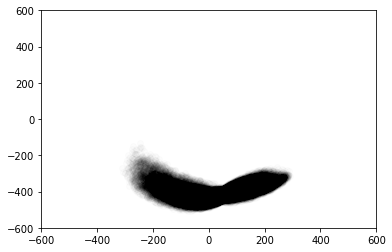

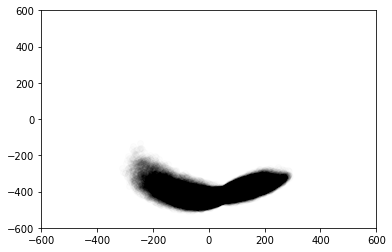

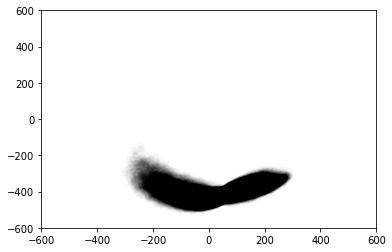

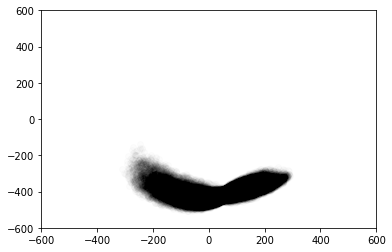

In [21]:
i=0
for i in range(1104):
    if i<10:
        ICLnfw = np.loadtxt("/Users/petersantana/Desktop/SImulation/00"+str(i)+"circ500"+".txt", skiprows=7)
        X = ICLnfw[:,1]
        Y = ICLnfw[:,2]       
        fig = plt.figure()
        ax = fig.add_subplot(111)
        # ax.plot_trisurf(X, Y, Z, color='white', edgecolors='grey', alpha=0.5)
        ax.scatter(X, Y, c='Black', alpha=0.01)
        ax.set_ylim(-600,600)
        ax.set_xlim(-600,600)
        plt.savefig("output"+str(i)+".jpg")
        plt.show()
    
    elif i >=10 and i<100:
        ICLnfw = np.loadtxt("/Users/petersantana/Desktop/SImulation/0"+str(i)+"circ500"+".txt", skiprows=7)
        X = ICLnfw[:,1]
        Y = ICLnfw[:,2]       
        fig = plt.figure()
        ax = fig.add_subplot(111)
        # ax.plot_trisurf(X, Y, Z, color='white', edgecolors='grey', alpha=0.5)
        ax.scatter(X, Y, c='Black', alpha=0.01)
        ax.set_ylim(-600,600)
        ax.set_xlim(-600,600)
        plt.savefig("output"+str(i)+".jpg")
        plt.show()
     
    elif i >=100:
        ICLnfw = np.loadtxt("/Users/petersantana/Desktop/SImulation/"+str(i)+"circ500"+".txt", skiprows=7)
        X = ICLnfw[:,1]
        Y = ICLnfw[:,2]       
        fig = plt.figure()
        ax = fig.add_subplot(111)
        # ax.plot_trisurf(X, Y, Z, color='white', edgecolors='grey', alpha=0.5)
        ax.scatter(X, Y, c='Black', alpha=0.01)
        ax.set_ylim(-600,600)
        ax.set_xlim(-600,600)
        plt.savefig("output"+str(i)+".jpg")
        plt.show()
    i +=1
    

In [31]:
Z3 = ICLnfw3[:,3]

RadiusFr3 = np.sqrt(X3**2 + Y3**2 + Z3**2)



In [68]:


RadiusFr = np.sqrt(X**2 + Y**2 + Z**2)

In [70]:
RadiusFr

array([95.38694833, 86.82442436, 75.67268096, ..., 77.04268649,
       66.02533578, 72.7616448 ])

In [114]:
xavg = np.average(X2)
yavg = np.average(Y2)
zavg = np.average(Z2)

In [115]:
centerofmass = []
centerofmass.append(xavg)
centerofmass.append(yavg)
centerofmass.append(zavg)

In [116]:
centerofmass

[83.10470969040628, -0.10807603169424383, -0.017166959248038256]

In [88]:
radiusofcenterofmass = np.sqrt(centerofmass[0] ** 2 + centerofmass[1] ** 2 + centerofmass[2] ** 2)

In [117]:
Xcentermassframe = X2 - centerofmass[0]
Ycentermassframe = Y2 - centerofmass[1]
Zcentermassframe = Z2 - centerofmass[2]

In [123]:
Xcentermassframe.sort()
Ycentermassframe.sort()
Zcentermassframe.sort()

In [126]:
Radiuscmf = np.sqrt(Xcentermassframe ** 2 + Ycentermassframe ** 2 + Zcentermassframe ** 2)

In [128]:
radiuswithinRcut = []

for i in Radiuscmf:
    if i < 100:
        radiuswithinRcut.append(i)

In [134]:
x2avg = np.average(Xcentermassframe[:len(radiuswithinRcut)])
y2avg = np.average(Ycentermassframe[:len(radiuswithinRcut)])
z2avg = np.average(Zcentermassframe[:len(radiuswithinRcut)])

centerofmass2 = []
centerofmass2.append(x2avg)
centerofmass2.append(y2avg)
centerofmass2.append(z2avg)

In [137]:
X2centermassframe = X2 - centerofmass[0]
Y2centermassframe = Y2 - centerofmass[1]
Z2centermassframe = Z2 - centerofmass[2]

-0.8976985073986015